<font color=blue size=8> ***2da Asignación***
<font color=black size=5> ***Cristian Gusseppe Albarracin Caballero-2152859***

In [1]:
import numpy as np
import sympy as sp
import matplotlib.pylab as plt
import pandas as pd
import openpyxl as op
from bokeh.io import output_notebook, show, output_file, export_png
from bokeh.plotting import figure, show 
from bokeh.models import Panel, Tabs

<font color=black size=4><p style='text-align: justify;'>***-Seleccionar dos espectros IR y dos espectros de masas del directorio Data***

In [2]:
Data_IR1= ("I:\\Analisis_de_Datos\\Datos\\IR1.CSV")
Data_IR2= ("I:\Analisis_de_Datos\Datos\\IR2.CSV")
Data_MS1= ("I:\Analisis_de_Datos\Datos\\MS2.txt")
Data_MS2= ("I:\Analisis_de_Datos\Datos\\MS3.txt")
IR1= np.loadtxt(Data_IR1, delimiter=',')
IR2= np.loadtxt(Data_IR2, delimiter=',')
MS1= np.loadtxt(Data_MS1)
MS2= np.loadtxt(Data_MS2)
IR1

array([[ 399.6813 ,    0.     ],
       [ 400.1635 ,   75.84647],
       [ 400.6456 ,   76.13815],
       ...,
       [3999.224  ,   99.40717],
       [3999.706  ,   99.40642],
       [4000.188  ,   99.40536]])

<font color=black size=4><p style='text-align: justify;'>***-Visualizar en dos gráficas los espectros de masas y los espectros de IR <font color=purple size=4>(matplotlib)***

In [3]:
Wavenumber1= (IR1[:, 0])
Wavenumber2= (IR2[:, 0])
Trans1= (IR1[:, 1])
Trans2= (IR2[:, 1])
Trans1

array([ 0.     , 75.84647, 76.13815, ..., 99.40717, 99.40642, 99.40536])

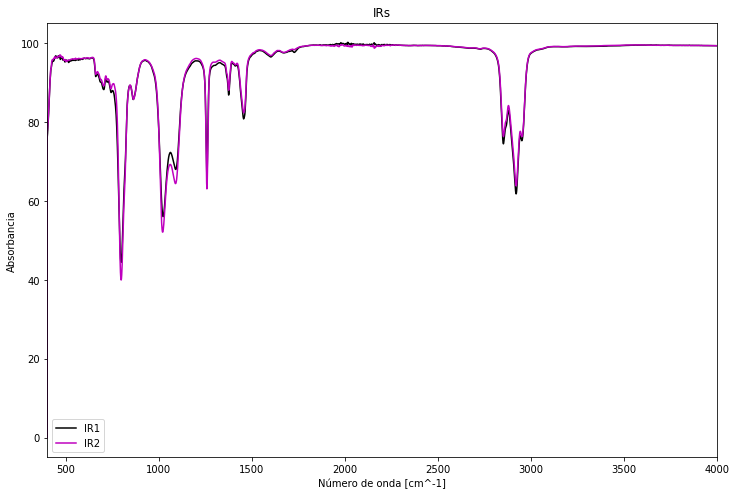

In [6]:
fig, ax1= plt.subplots(figsize=(12,8))

ax1.plot(Wavenumber1, Trans1, 'k', label= 'IR1')
ax1.plot(Wavenumber2, Trans2, 'm', label= 'IR2')
ax1.set_xlim(400, 4000)
#ax1.set_ylim(0.00, 1.00)
ax1.set_title("IRs")
ax1.set_xlabel("Número de onda [cm^-1]")
ax1.set_ylabel("Absorbancia")
leg= ax1.legend()
fig.savefig("FTIRs.jpg", dpi = 140)


C:\Users\Zoom\anaconda3\lib\site-packages\ipykernel_launcher.py:10: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  # Remove the CWD from sys.path while we load stuff.
C:\Users\Zoom\anaconda3\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


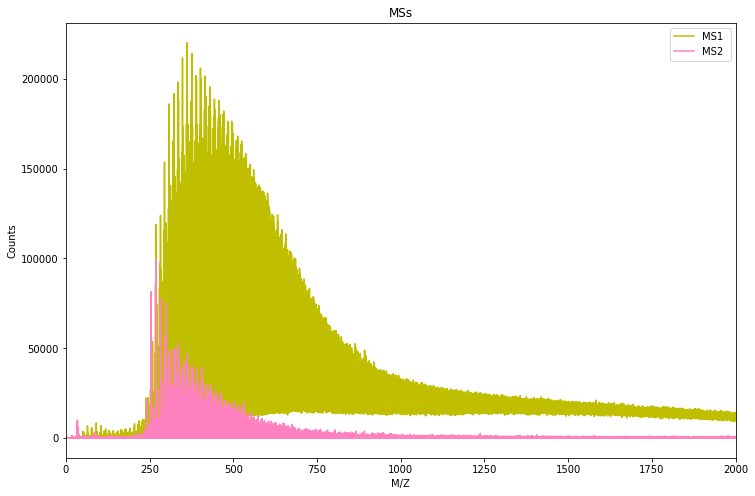

In [8]:
fig, ax2= plt.subplots(figsize=(12,8))

ax2.plot(MS1[:, 0], MS1[:, 1], 'y', label='MS1')
ax2.plot(MS2[:, 0], MS2[:, 1]*50, '#FF81C0', label='MS2 ')
ax2.set_xlim(0, 2000)
ax2.set_title("MSs")
ax2.set_xlabel("M/Z")
ax2.set_ylabel("Counts")
lag= ax2.legend()
fig.savefig("MSs.jpg", dpi = 140)

<font color=black size=4><p style='text-align: justify;'>***-Visualizar en 4 gráficas (2,2) las cuatro espectros <font color=purple size=4>(matplotlib)***

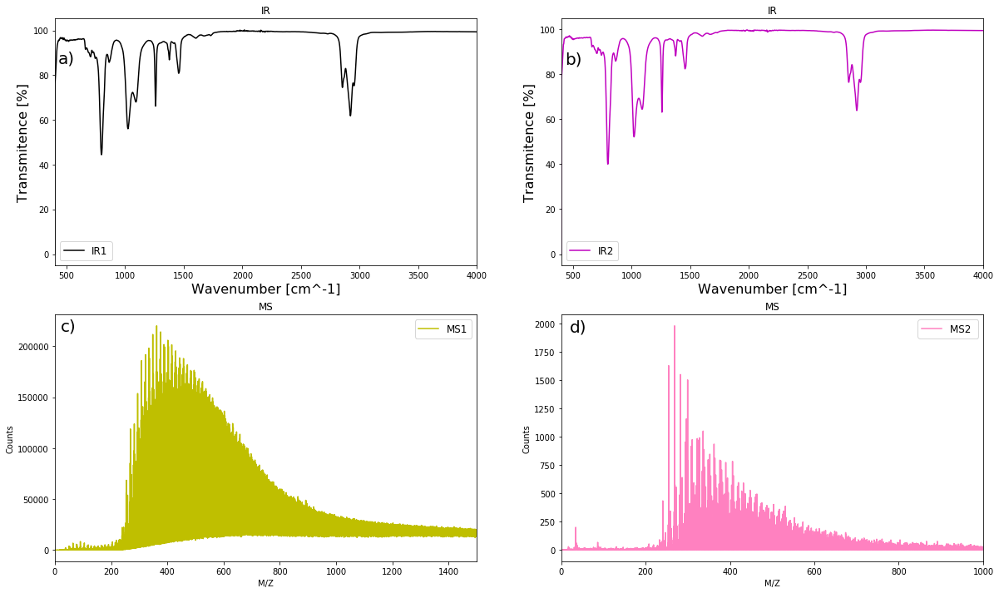

In [13]:
fig, ax3= plt.subplots(2,2, figsize=(20, 12))

#Grafica IR1#
ax3[0, 0].plot(Wavenumber1, Trans1, 'k', label='IR1')
ax3[0, 0].legend(loc='best', fontsize=12)
ax3[0, 0].set_xlim(400, 4000)
ax3[0, 0].set_xlabel('Wavenumber [cm^-1]', fontsize=16)
ax3[0, 0].set_ylabel('Transmitence [%]', fontsize=16)
ax3[0, 0].text(np.min(Wavenumber1)+30, np.max(Trans1)-15, 'a)', fontsize=20, color="black")
ax3[0, 0].set_title("IR")

#Grafica IR2#
ax3[0, 1].plot(Wavenumber2, Trans2, 'm', label='IR2')
ax3[0, 1].legend(loc='best', fontsize=12)
ax3[0, 1].set_xlim(400, 4000)
ax3[0, 1].set_xlabel('Wavenumber [cm^-1]', fontsize=16)
ax3[0, 1].set_ylabel('Transmitence [%]', fontsize=16)
ax3[0, 1].text(np.min(Wavenumber2)+30, np.max(Trans2)-15, 'b)', fontsize=20, color="black")
ax3[0, 1].set_title("IR")

#Grafica MS1#
ax3[1, 0].plot(MS1[:, 0], MS1[:, 1], 'y', label='MS1')
ax3[1, 0].legend(loc='best', fontsize=12)
ax3[1, 0].set_xlim(0, 1500)
ax3[1, 0].set_title("MS")
ax3[1, 0].set_xlabel("M/Z")
ax3[1, 0].set_ylabel("Counts")
ax3[1, 0].text(np.min(MS1[:, 0])+20, np.max(MS1[:, 1])-5000, 'c)', fontsize=20, color="black")

#Grafica SGO-60#
ax3[1, 1].plot(MS2[:, 0], MS2[:, 1], '#FF81C0', label='MS2 ')
ax3[1, 1].legend(loc='best', fontsize=12)
ax3[1, 1].set_xlim(0, 1000)
ax3[1, 1].set_title("MS")
ax3[1, 1].set_xlabel("M/Z")
ax3[1, 1].set_ylabel("Counts")
ax3[1, 1].text(np.min(MS2[:, 0])+20, np.max(MS2[:, 1])-50, 'd)', fontsize=20, color="black")

fig.savefig("4figures.jpg", dpi = 140)

<font color=black size=4><p style='text-align: justify;'>***-Visualizar con <font color=red size=4>Bokeh <font color=black size=4>los espectros IR en unos gráfica y los espectros de masas en otra gráfica***

In [15]:
output_notebook()
IR = figure(title='IRs', plot_width=600, plot_height=400, x_range=(400, 4000), y_range=(0, 100),
           x_axis_label='Wavenumber (cm-1)', y_axis_label='% Transmitance', toolbar_location="above")
IR.grid.grid_line_alpha=0.3

IR.line(Wavenumber1, Trans1, color='black', legend_label='IR1', line_width=2, alpha=1)
IR.line(Wavenumber2, Trans2, color='magenta', legend_label='IR2', line_width=2, alpha=1)
IR.legend.location = "top_right"
IR.grid.visible = True
IR.title.align = "center"
IR.title.text_font_size = "20px"
show(IR)

Loading BokehJS ...

In [18]:
output_notebook()
MS = figure(title='MSs', plot_width=600, plot_height=400, x_range=(0, 1500), y_range=(0, 250000),
           x_axis_label='M/Z', y_axis_label='Counts', toolbar_location="above")
MS.grid.grid_line_alpha=0.3

MS.line(MS1[:, 0], MS1[:, 1], color='pink', legend_label='MS1', line_width=2, alpha=1)
MS.line(MS2[:, 0], MS2[:, 1], color='yellow', legend_label='MS2', line_width=2, alpha=1)
MS.legend.location = "top_right"
MS.grid.visible = True
MS.title.align = "center"
MS.title.text_font_size = "20px"
show(MS)

Loading BokehJS ...

<font color=black size=4><p style='text-align: justify;'>Utilizar la función de paneles de <font color=red size=4>Bokeh <font color=black size=4>para Visualizar los espectros en gráficas separadas

In [20]:
TOOLS="hover,crosshair,pan,wheel_zoom,zoom_in,zoom_out,box_zoom,undo,redo,reset,tap,save,box_select,poly_select,lasso_select,"

output_notebook()
IR1 = figure(title='IRs', plot_width=600, plot_height=400, x_range=(400, 4000), y_range=(0, 100),
           x_axis_label='Wavenumber (cm-1)', y_axis_label='% Transmitance', toolbar_location="above", tools=TOOLS)

IR1.line(Wavenumber1, Trans1, color='black', legend_label='IR1', line_width=2, alpha=0.9)
IR1.legend.location = "top_right"
IR1.grid.visible = True
IR1.title.align = "center"
IR1.title.text_font_size = "20px"
tab1 = Panel(child=IR1, title="IR1")

IR2 = figure(title='IRs', plot_width=600, plot_height=400, x_range=(400, 4000), y_range=(0, 100),
           x_axis_label='Wavenumber (cm-1)', y_axis_label='% Transmitance', toolbar_location="above", tools=TOOLS)

IR2.line(Wavenumber2, Trans2, color='magenta', legend_label='IR2', line_width=2, alpha=0.9)
IR2.legend.location = "top_right"
IR2.grid.visible = True
IR2.title.align = "center"
IR2.title.text_font_size = "20px"
tab2 = Panel(child=IR2, title="IR2")


show(Tabs(tabs=[tab1, tab2])), #tab3, tab4]))

Loading BokehJS ...

(None,)

In [23]:
M_Z1= MS1[:, 0]
Counts1= MS1[:, 1]
M_Z2= MS2[:, 0]
Counts2= MS2[:, 1]
Counts1

TypeError: 'Figure' object is not subscriptable

In [22]:
TOOLS="hover,crosshair,pan,wheel_zoom,zoom_in,zoom_out,box_zoom,undo,redo,reset,tap,save,box_select,poly_select,lasso_select,"

output_notebook()
MS1 = figure(title='MSs', plot_width=600, plot_height=400, x_range=(0, 1500), y_range=(0, 250000),
         x_axis_label='M/Z', y_axis_label='Counts', toolbar_location="above", tools=TOOLS)

MS1.line(MS1[:, 0], MS1[:, 1], color='yellow', legend_label='MS1', line_width=2, alpha=0.9)
MS1.legend.location = "top_right"
MS1.grid.visible = True
MS1.title.align = "center"
MS1.title.text_font_size = "20px"
tab3 = Panel(child=MS1, title='MS1')

MS2 = figure(title='MSs', plot_width=600, plot_height=400, x_range=(0, 1500), y_range=(0, 2100),
           x_axis_label='M/Z', y_axis_label='Counts', toolbar_location="above", tools=TOOLS)

MS2.line(MS2[:, 0], MS2[:, 1], color='pink', legend_label='MS2', line_width=2, alpha=0.9)
MS2.legend.location = "top_right"
MS2.grid.visible = True
MS2.title.align = "center"
MS2.title.text_font_size = "20px"
tab4 = Panel(child=MS2, title='MS2')
show(Tabs=tabs([tab3, tab4]))

Loading BokehJS ...

TypeError: 'Figure' object is not subscriptable